In [1]:
from diffusers import MarigoldDepthPipeline
import torch
import cv2
def load_depth_model():
    from diffusers import MarigoldDepthPipeline
    depth_model_path = "prs-eth/marigold-depth-lcm-v1-0"
    pipe = MarigoldDepthPipeline.from_pretrained(
    "prs-eth/marigold-depth-lcm-v1-0", variant="fp16", torch_dtype=torch.float16
    ).to('cuda')
    pipe.enable_model_cpu_offload()
    return pipe

def visualize_depth_numpy(depth, minmax=None, cmap=cv2.COLORMAP_TURBO):
    """
    depth: (H, W)
    """
    x = np.nan_to_num(depth)  # change nan to 0
    if minmax is None:
        if (x > 0).any():
            mi = np.min(x[x > 0])  # get minimum positive depth (ignore background)
            ma = np.max(x)
        else:
            mi = 0.0
            ma = 0.0
    else:
        mi, ma = minmax

    x = (x - mi) / (ma - mi + 1e-8)  # normalize to 0~1
    x = (255 * x).astype(np.uint8)
    x_ = cv2.applyColorMap(x, cmap)
    return x_, [mi, ma]

# Assuming out_depth is a 2D numpy array with depth values
def convert_depth_to_image(out_depth):
    # Normalize depth values to the range [0, 1]
    depth_min = np.min(out_depth)
    depth_max = np.max(out_depth)
    normalized_depth = (out_depth - depth_min) / (depth_max - depth_min)

    # Scale to the range [0, 255] and convert to uint8
    depth_image_8bit = (normalized_depth * 255).astype(np.uint8)

    # Convert to a PIL Image
    depth_pil_image = Image.fromarray(depth_image_8bit, mode='L')

    return depth_pil_image

In [2]:
def infer_marigold(depth_model,image):
    #depth_model = load_depth_model()
    depth = depth_model(image).prediction
    print(depth.squeeze().shape)
    depth = depth.squeeze()
    # Normalize depth values to the range [0, 1]
    depth_min = np.min(depth)
    depth_max = np.max(depth)
    normalized_depth = (depth - depth_min) / (depth_max - depth_min)
    #depth_image = depth_model.image_processor.export_depth_to_16bit_png(depth.prediction)[0]
    processed_image = convert_depth_to_image(depth)
    #processed_image = depth_model.image_processor.visualize_depth(depth, color_map="binary")[0]
    #visualize_depth_numpy(depth, minmax=None, cmap=cv2.COLORMAP_TURBO)
    return normalized_depth, processed_image

In [3]:
depth_model = load_depth_model()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

/home/descobar/miniconda3/envs/pixelspace/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Potentially unsupported `prediction_type='None'`; values supported by the pipeline: ('depth', 'disparity').


In [ ]:
def infer_with_pad(model, x, pad_input: bool = True, fh: float = 3, fw: float = 3, upsampling_mode: str = "bicubic", padding_mode: str = "reflect", **kwargs):
    assert x.dim() == 4, "x must be 4 dimensional, got {}".format(x.dim())

    if pad_input:
        assert fh > 0 or fw > 0, "atlease one of fh and fw must be greater than 0"
        pad_h = int(np.sqrt(x.shape[2]/2) * fh)
        pad_w = int(np.sqrt(x.shape[3]/2) * fw)
        padding = [pad_w, pad_w]
        if pad_h > 0:
            padding += [pad_h, pad_h]
        
        x_rgb = x[:, :3]
        x_remaining = x[:, 3:]
        x_rgb = F.pad(x_rgb, padding, mode=padding_mode, **kwargs)
        x_remaining = F.pad(x_remaining, padding, mode="constant", value=0, **kwargs)
        x = torch.cat([x_rgb, x_remaining], dim=1)
    out = model(x)["metric_depth"]
    if out.shape[-2:] != x.shape[-2:]:
        out = F.interpolate(out, size=(x.shape[2], x.shape[3]), mode=upsampling_mode, align_corners=False)
    if pad_input:
        # crop to the original size, handling the case where pad_h and pad_w is 0
        if pad_h > 0:
            out = out[:, :, pad_h:-pad_h,:]
        if pad_w > 0:
            out = out[:, :, :, pad_w:-pad_w]
    return out

@torch.no_grad()
def infer_with_zoe_dc(zoe_dc, image, sparse_depth, scaling: float = 1):
    sparse_depth_mask = (sparse_depth[None, None, ...] > 0).float()
    # the metric depth range defined during training is [1e-3, 10]
    x = torch.cat([image[None, ...], sparse_depth[None, None, ...] / (float(scaling) * 10.0), sparse_depth_mask], dim=1).to(zoe_dc.device)

    out = infer_with_pad(zoe_dc, x)
    out_flip = infer_with_pad(zoe_dc, torch.flip(x, dims=[3]))
    out = (out + torch.flip(out_flip, dims=[3])) / 2

    pred_depth = float(scaling) * out

    return torch.nn.functional.interpolate(pred_depth, image.shape[-2:], mode='bilinear', align_corners=True)[0, 0]

In [6]:
from PIL import Image

image = Image.open("/home/descobar/projects/xbase/samples/images/magnific-2navRnauqRDOCHjQlFXO-image-1718724248-1.png").convert("RGB").resize((512,512))


In [12]:
def infer_with_pad(model, 
                   x, 
                   pad_input: bool = True, 
                   fh: float = 3, 
                   fw: float = 3, 
                   upsampling_mode: str = "bicubic", 
                   padding_mode: str = "reflect", **kwargs):
    assert x.dim() == 4, "x must be 4 dimensional, got {}".format(x.dim())

    if pad_input:
        assert fh > 0 or fw > 0, "atlease one of fh and fw must be greater than 0"
        pad_h = int(np.sqrt(x.shape[2]/2) * fh)
        pad_w = int(np.sqrt(x.shape[3]/2) * fw)
        padding = [pad_w, pad_w]
        if pad_h > 0:
            padding += [pad_h, pad_h]
        
        x_rgb = x[:, :3]
        x_remaining = x[:, 3:]
        x_rgb = F.pad(x_rgb, padding, mode=padding_mode, **kwargs)
        x_remaining = F.pad(x_remaining, padding, mode="constant", value=0, **kwargs)
        x = torch.cat([x_rgb, x_remaining], dim=1)
    out = depth_model(image).prediction
    if out.shape[-2:] != x.shape[-2:]:
        out = F.interpolate(out, size=(x.shape[2], x.shape[3]), mode=upsampling_mode, align_corners=False)
    if pad_input:
        # crop to the original size, handling the case where pad_h and pad_w is 0
        if pad_h > 0:
            out = out[:, :, pad_h:-pad_h,:]
        if pad_w > 0:
            out = out[:, :, :, pad_w:-pad_w]
    return out

@torch.no_grad()
def infer_with_marigold(model, 
                      image, 
                      sparse_depth=None, 
                      scaling: float = 1):
    #sparse_depth_mask = (sparse_depth[None, None, ...] > 0).float()
    # the metric depth range defined during training is [1e-3, 10]
    #x = torch.cat([image[None, ...], sparse_depth[None, None, ...] / (float(scaling) * 10.0), sparse_depth_mask], dim=1).to(zoe_dc.device)
    x = image[None, ...].to(model.device)
    out = infer_with_pad(model, x)
    out_flip = infer_with_pad(model, torch.flip(x, dims=[3]))
    out = (out + torch.flip(out_flip, dims=[3])) / 2

    pred_depth = float(scaling) * out
    
    processed_image = convert_depth_to_image(pred_depth)
    
    pred_depth = torch.nn.functional.interpolate(pred_depth, image.shape[-2:], mode='bilinear', align_corners=True)[0, 0]

    return pred_depth, processed_image

In [138]:
depth, depth_pil = infer_marigold(depth_model,image)

Marigold predictions...:   0%|          | 0/1 [00:00<?, ?it/s]

Diffusion steps...:   0%|          | 0/1 [00:00<?, ?it/s]

(512, 512)


In [76]:
depth = snap_high_gradients_to_nn(depth, threshold=20)

(512, 512)

In [77]:
depth.squeeze().shape

(512, 512)

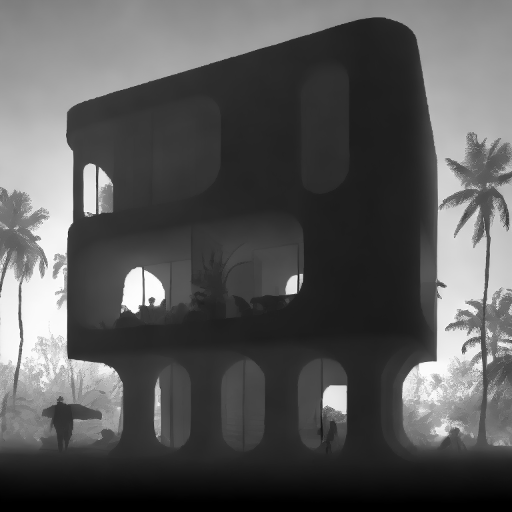

In [78]:
depth_pil

In [31]:
import torch
import torch.nn.functional as F
import numpy as np

def infer_with_pad(model, 
                   x, 
                   pad_input: bool = True, 
                   fh: float = 3, 
                   fw: float = 3, 
                   upsampling_mode: str = "bicubic", 
                   padding_mode: str = "reflect", **kwargs):
    assert x.dim() == 4, "x must be 4 dimensional, got {}".format(x.dim())

    if pad_input:
        assert fh > 0 or fw > 0, "At least one of fh and fw must be greater than 0"
        pad_h = int(np.sqrt(x.shape[2]/2) * fh)
        pad_w = int(np.sqrt(x.shape[3]/2) * fw)
        padding = [pad_w, pad_w]
        if pad_h > 0:
            padding += [pad_h, pad_h]
        
        x_rgb = x[:, :3]
        x_remaining = x[:, 3:]
        x_rgb = F.pad(x_rgb, padding, mode=padding_mode, **kwargs)
        x_remaining = F.pad(x_remaining, padding, mode="constant", value=0, **kwargs)
        x = torch.cat([x_rgb, x_remaining], dim=1)

    print(x.shape)
    # Use the model passed to the function
    out = depth_model(x).prediction  
    print(out.shape)
    processed_image = convert_depth_to_image(depth.cpu().numpy())
    out = torch.from_numpy(out)
    print(out.shape)
    if out.shape[-2:] != x.shape[-2:]:
        out = F.interpolate(out, size=(x.shape[2], x.shape[3]), mode=upsampling_mode, align_corners=False)
    
    if pad_input:
        # Crop to the original size, handling the case where pad_h and pad_w is 0
        if pad_h > 0:
            out = out[:, :, pad_h:-pad_h, :]
        if pad_w > 0:
            out = out[:, :, :, pad_w:-pad_w]
    
    return out, processed_image

@torch.no_grad()
def infer_with_marigold(model, image, sparse_depth=None, scaling: float = 1):
    # Ensure image is on the same device as the model
    x = image[None, ...].to(model.device)
    print(x.shape)
    out, processed_image = infer_with_pad(model, x)
    out_flip = infer_with_pad(model, torch.flip(x, dims=[3]))
    out = (out + torch.flip(out_flip, dims=[3])) / 2

    pred_depth = float(scaling) * out
    
    #processed_image = convert_depth_to_image(pred_depth)  # Assuming this is defined elsewhere
    
    pred_depth = torch.nn.functional.interpolate(pred_depth, image.shape[-2:], mode='bilinear', align_corners=True)[0, 0]

    return pred_depth


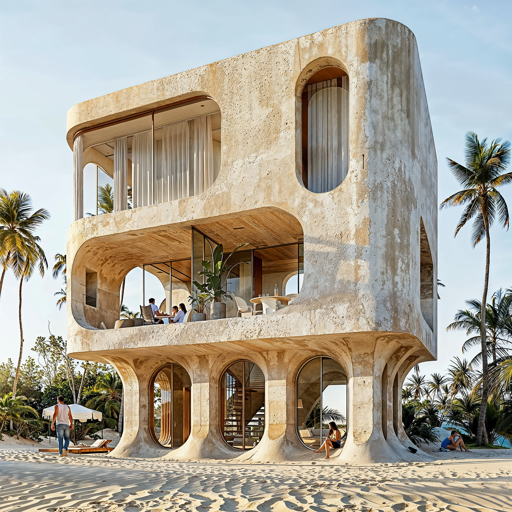

In [34]:
from PIL import Image

image = Image.open("/home/descobar/projects/xbase/samples/images/magnific-2navRnauqRDOCHjQlFXO-image-1718724248-1.png").convert("RGB").resize((1024,1024))

torch.Size([1, 3, 1024, 1024])
torch.Size([1, 3, 1158, 1158])


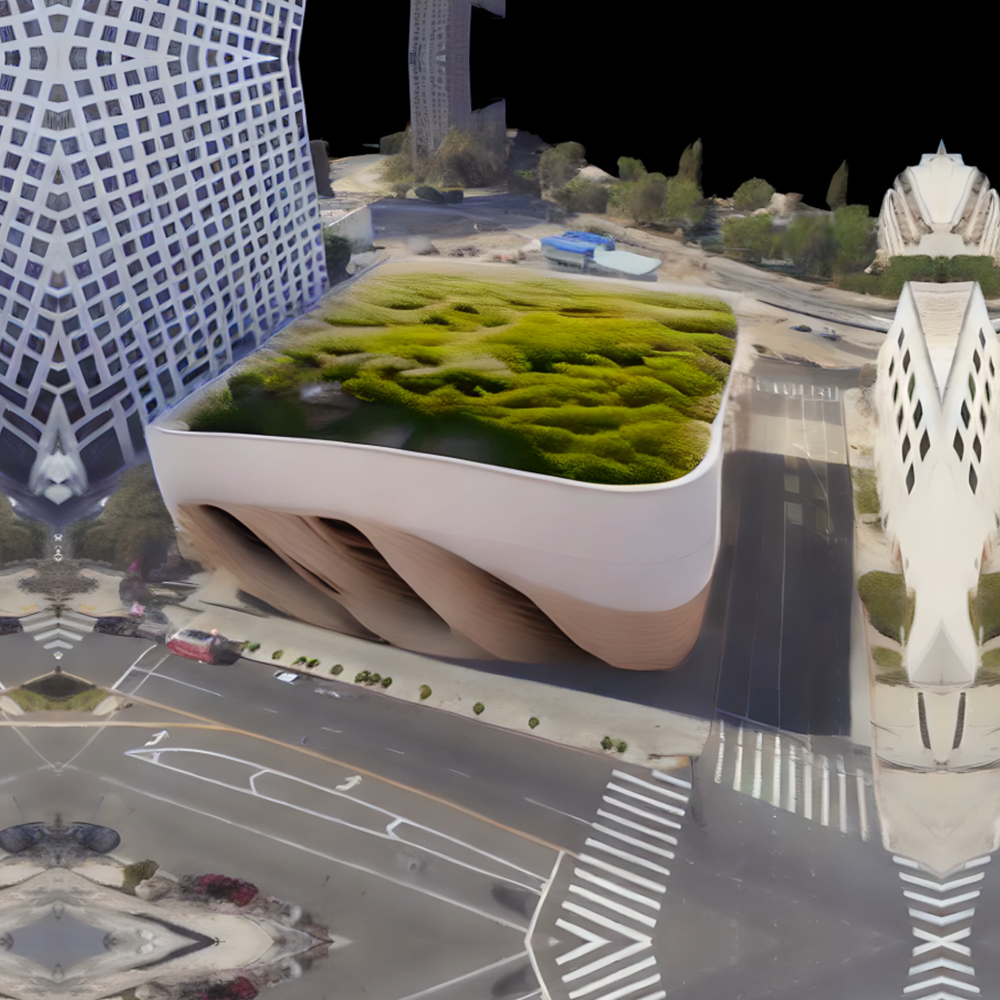

In [48]:
from torchvision import transforms
import numpy as np
import torch.nn.functional as F  # This line fixes the NameError\
from PIL import Image


image = Image.open("/home/descobar/projects/xbase/samples/images/r_16.png").convert("RGB").resize((1024,1024))
# Step 2: Convert the PIL image to a PyTorch tensor
transform = transforms.ToTensor()
tensor_image = transform(image)

pad_input: bool = True
fh: float = 3 
fw: float = 3
upsampling_mode: str = "bicubic"
padding_mode: str = "reflect"

x = tensor_image[None, ...].to(depth_model.device)
print(x.shape)

assert x.dim() == 4, "x must be 4 dimensional, got {}".format(x.dim())

if pad_input:
    assert fh > 0 or fw > 0, "At least one of fh and fw must be greater than 0"
    pad_h = int(np.sqrt(x.shape[2]/2) * fh)
    pad_w = int(np.sqrt(x.shape[3]/2) * fw)
    padding = [pad_w, pad_w]
    if pad_h > 0:
        padding += [pad_h, pad_h]
    
    x_rgb = x[:, :3]
    x_remaining = x[:, 3:]
    x_rgb = F.pad(x_rgb, padding, mode=padding_mode)
    x_remaining = F.pad(x_remaining, padding, mode="constant", value=0)
    x = torch.cat([x_rgb, x_remaining], dim=1)

print(x.shape)
# Convert the tensor directly to a PIL image in one step
image_pil = transforms.ToPILImage()(x.squeeze(0))

# Now you can display or save the PIL image
image_pil

In [49]:
# Use the model passed to the function

out = depth_model(x).prediction  
print(out.shape)
processed_image = convert_depth_to_image(out.squeeze())
out = torch.from_numpy(out)
print(out.shape)
if out.shape[-2:] != x.shape[-2:]:
    out = F.interpolate(out, size=(x.shape[2], x.shape[3]), mode=upsampling_mode, align_corners=False)

if pad_input:
    # Crop to the original size, handling the case where pad_h and pad_w is 0
    if pad_h > 0:
        out = out[:, :, pad_h:-pad_h, :]
    if pad_w > 0:
        out = out[:, :, :, pad_w:-pad_w]

print(out.shape)

Marigold predictions...:   0%|          | 0/1 [00:00<?, ?it/s]

Diffusion steps...:   0%|          | 0/1 [00:00<?, ?it/s]

(1, 1158, 1158, 1)
torch.Size([1, 1158, 1158, 1])
torch.Size([1, 1158, 1024, 1024])


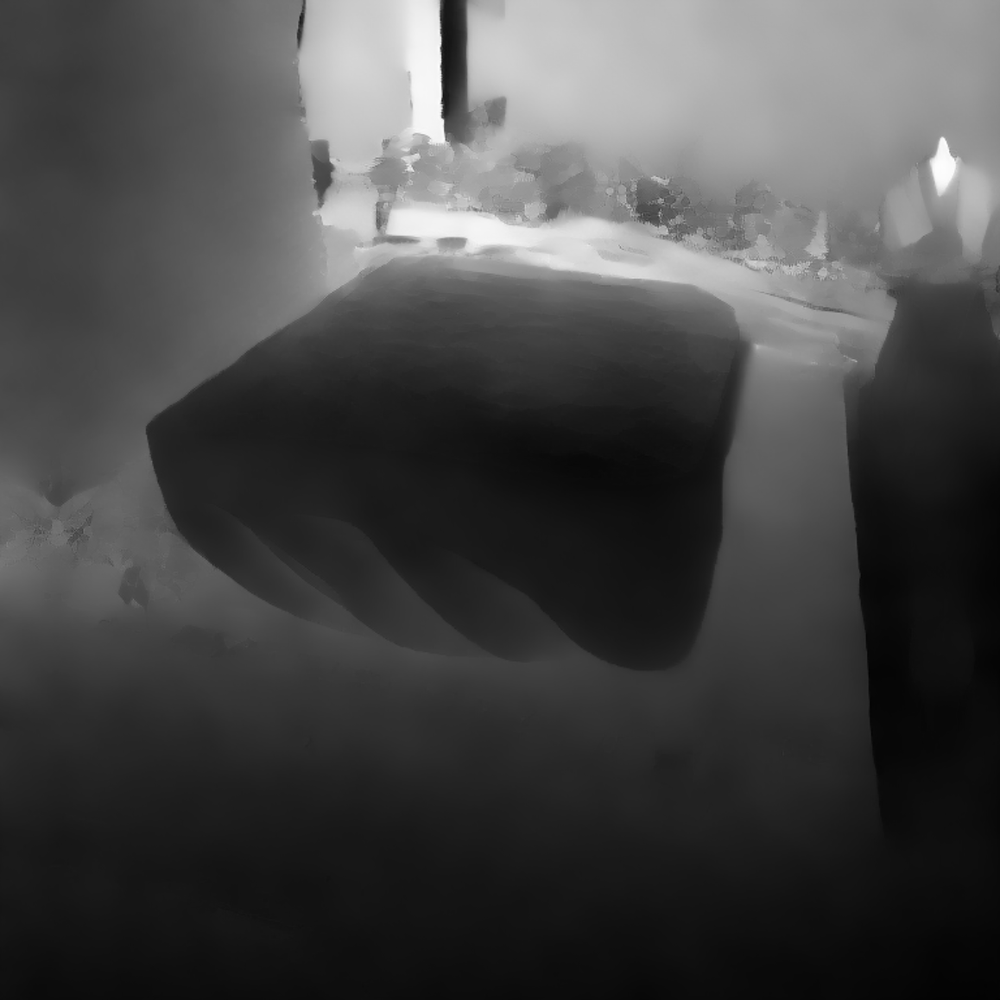

In [50]:
processed_image

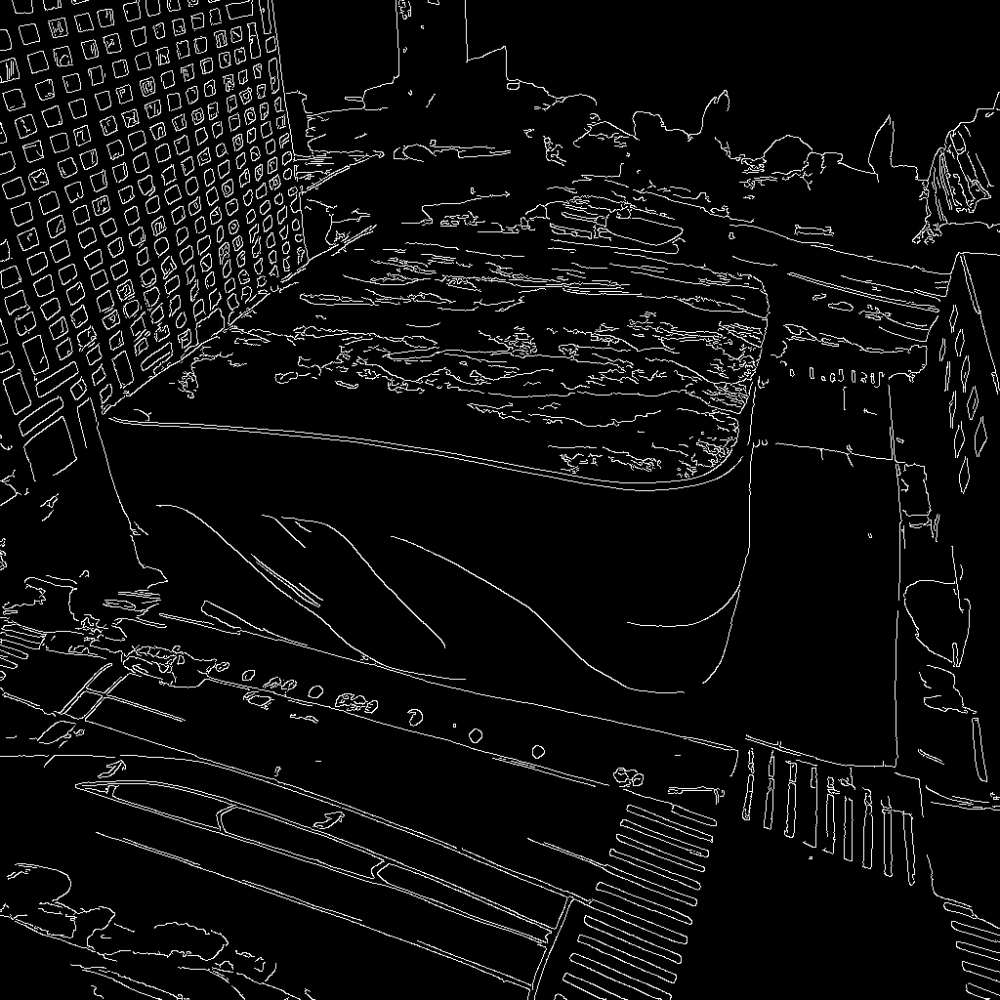

In [53]:
import os
import numpy as np
import cv2
from PIL import Image

def getcanny(img):
  #canny
  image = np.array(img)
  image = cv2.Canny(image, 100, 200)
  image = image[:, :, None]
  image = np.concatenate([image, image, image], axis=2)
  canny_image = Image.fromarray(image)
  return canny_image

canny = getcanny(image)
canny

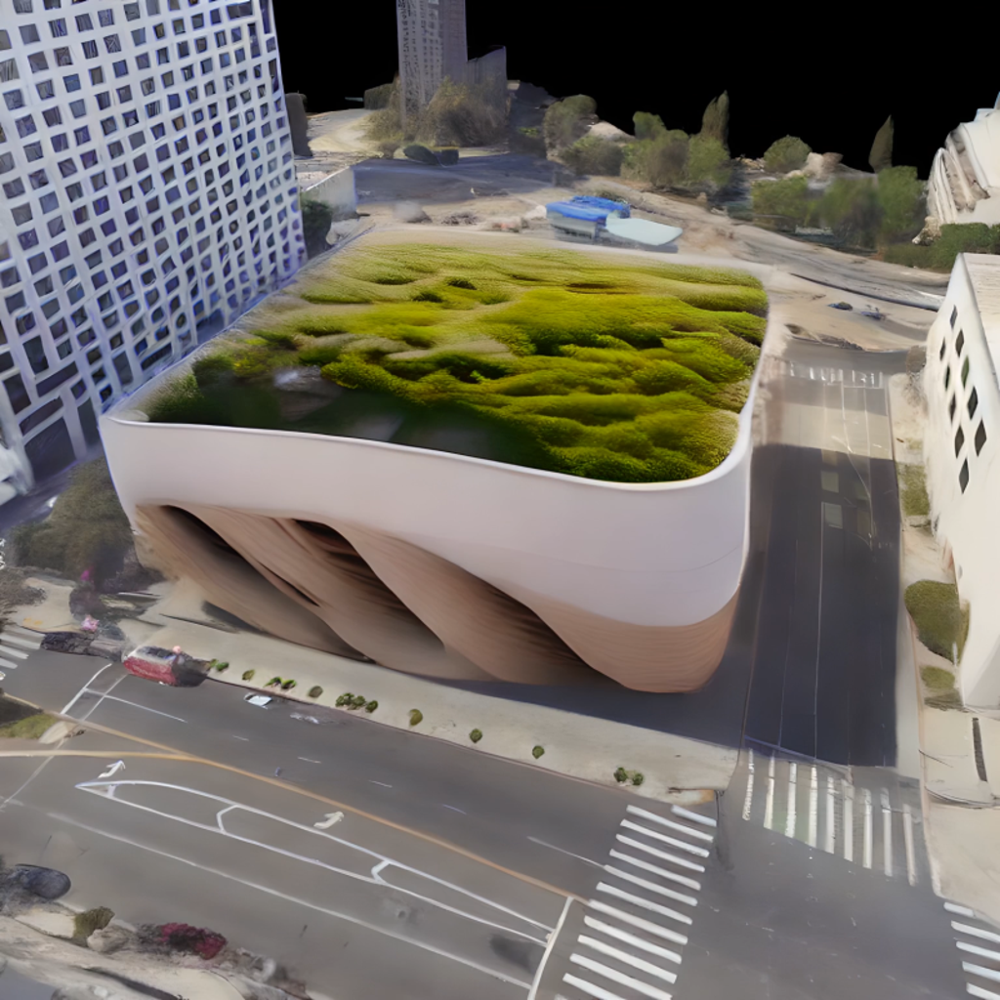

In [54]:
image

In [56]:
import os
import torch
from diffusers import AutoPipelineForInpainting, UNet2DConditionModel,StableDiffusionXLInpaintPipeline

from PIL import Image
import numpy as np
from diffusers.utils import load_image


def run_pipeline(config, output_path, save = True):
    generator = torch.manual_seed(config['random_seed'])
    """
    pipe = AutoPipelineForInpainting.from_pretrained(
        config["base_model"],
        torch_dtype=torch.float16,
        variant="fp16",
    ).to("cuda")
    """
    pipe = StableDiffusionXLInpaintPipeline.from_pretrained(
        "SG161222/RealVisXL_V4.0",
        torch_dtype=torch.float16,
        variant="fp16",
        use_safetensors=True,
        )
    
    pipe.enable_model_cpu_offload()

    init_image = load_image(config["init_image"]).convert("RGB")
    init_image = init_image.resize((1024, 1024), Image.Resampling.LANCZOS)
    mask_image = load_image(config["mask_image"]).convert("RGB")
    mask_image = mask_image.resize((1024, 1024), Image.Resampling.LANCZOS)
    
    if save:
        save_image(init_image, f"init_image", config['random_seed'], output_path)
        save_image(mask_image, f"mask_image", config['random_seed'], output_path)
    
    prompt = config["prompt"]
    print(init_image, mask_image)
   
    image = pipe(prompt=prompt, 
                 image=init_image, 
                 mask_image=mask_image, 
                 num_inference_steps=config['num_inference_steps'], 
                 strength=config['strength'],
                 generator=generator,
                ).images[0]
    
    save_image(image, f"inpaint_{config['strength']}" + config['prompt'], config['random_seed'], output_path)
    return image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F4F916E2230> <PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F5138317A60>


  0%|          | 0/17 [00:00<?, ?it/s]

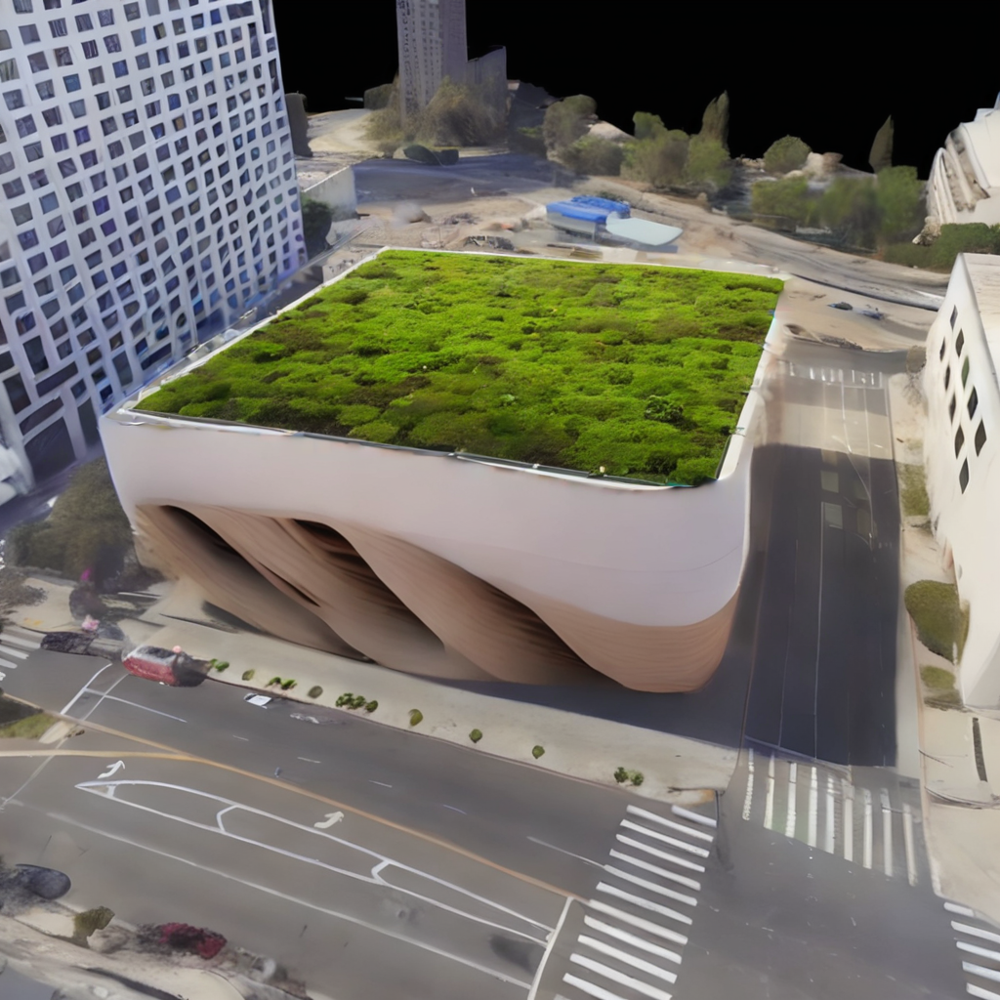

In [59]:
pipe = StableDiffusionXLInpaintPipeline.from_pretrained(
        "SG161222/RealVisXL_V4.0",
        torch_dtype=torch.float16,
        variant="fp16",
        use_safetensors=True,
        )
    
pipe.enable_model_cpu_offload()

init_image = load_image("/home/descobar/projects/xbase/samples/images/r_16.png").convert("RGB")
init_image = init_image.resize((1024, 1024), Image.Resampling.LANCZOS)
mask_image = load_image('/home/descobar/projects/xbase/samples/masks/Mask01.png').convert("RGB")
mask_image = mask_image.resize((1024, 1024), Image.Resampling.LANCZOS)
random_seed = 44 

prompt = "a green urban outdoor roof on top of a building"
print(init_image, mask_image)
generator = torch.manual_seed(random_seed)

image = pipe(prompt=prompt, 
                image=init_image, 
                mask_image=mask_image, 
                num_inference_steps=25, 
                strength=0.7,
                generator=generator,
            ).images[0]

image

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F4F916E2230> <PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F5138317A60>


  0%|          | 0/17 [00:00<?, ?it/s]

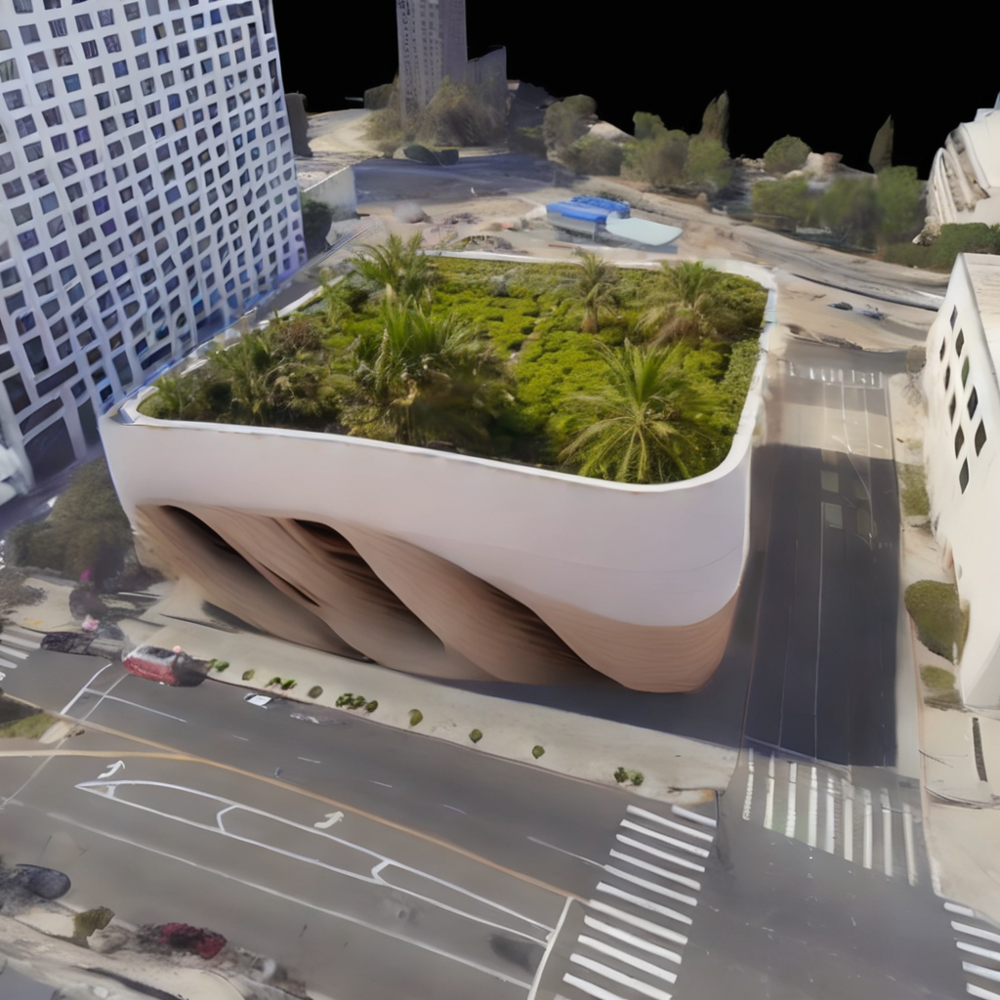

In [62]:
prompt = "a drone view of a roof with palm trees, meandering paths and people walking around enjoying the outdoor space in the middle of the city"
print(init_image, mask_image)
generator = torch.manual_seed(random_seed)

image = pipe(prompt=prompt, 
                image=init_image, 
                mask_image=mask_image, 
                num_inference_steps=25, 
                strength=0.7,
                generator=generator,
            ).images[0]

image

In [32]:
from torchvision import transforms
import numpy as np
import torch.nn.functional as F  # This line fixes the NameError

# Step 2: Convert the PIL image to a PyTorch tensor
transform = transforms.ToTensor()
tensor_image = transform(image)

depth = infer_with_marigold(depth_model, 
                    tensor_image,  
                    scaling = 1)

torch.Size([1, 3, 512, 512])
torch.Size([1, 3, 608, 608])


Marigold predictions...:   0%|          | 0/1 [00:00<?, ?it/s]

Diffusion steps...:   0%|          | 0/1 [00:00<?, ?it/s]

(1, 608, 608, 1)
torch.Size([1, 608, 608, 1])
torch.Size([1, 3, 608, 608])


Marigold predictions...:   0%|          | 0/1 [00:00<?, ?it/s]

Diffusion steps...:   0%|          | 0/1 [00:00<?, ?it/s]

(1, 608, 608, 1)
torch.Size([1, 608, 608, 1])


TypeError: flip(): argument 'input' (position 1) must be Tensor, not tuple

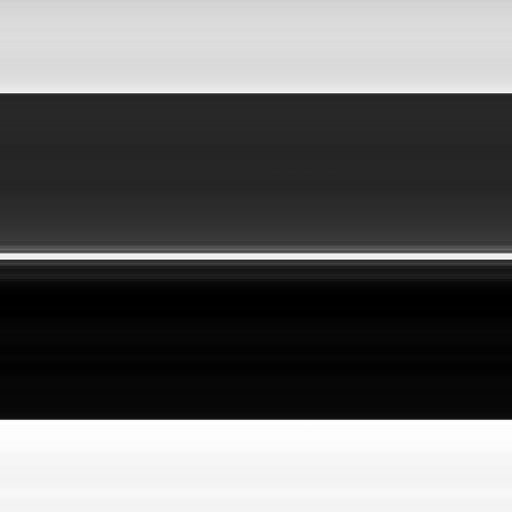

In [30]:

processed_image = convert_depth_to_image(depth.cpu().numpy())
processed_image

In [128]:
import numpy as np

def project_points(cameras, depth, use_pixel_centers=True):
    if len(cameras) > 1:
        import warnings
        warnings.warn("project_points assumes only a single camera is used")

    depth_t = torch.from_numpy(depth) if isinstance(depth, np.ndarray) else depth
    depth_t = depth_t.to(cameras.device)

    pixel_center = 0.5 if use_pixel_centers else 0

    fx, fy = cameras.focal_length[0, 1], cameras.focal_length[0, 0]
    cx, cy = cameras.principal_point[0, 1], cameras.principal_point[0, 0]

    i, j = torch.meshgrid(
        torch.arange(cameras.image_size[0][0], dtype=torch.float32, device=cameras.device) + pixel_center,
        torch.arange(cameras.image_size[0][1], dtype=torch.float32, device=cameras.device) + pixel_center,
        indexing="xy",
    )

    directions = torch.stack(
        [-(i - cx) * depth_t / fx, -(j - cy) * depth_t / fy, depth_t], -1
    )

    xy_depth_world = cameras.get_world_to_view_transform().inverse().transform_points(directions.view(-1, 3)).unsqueeze(0)

    return xy_depth_world

import numpy as np
import torch
import skimage
from scipy import ndimage
from PIL import Image
from pytorch3d.structures import Pointclouds
import matplotlib.pyplot as plt

import math

def nearest_neighbor_fill(img, mask, erosion=0):
    img_ = np.copy(img.cpu().numpy())

    if erosion > 0:
        eroded_mask = skimage.morphology.binary_erosion(mask.cpu().numpy(), footprint=skimage.morphology.disk(erosion))
    else:
        eroded_mask = mask.cpu().numpy()

    img_[eroded_mask <= 0] = np.nan

    distance_to_boundary = ndimage.distance_transform_bf((~eroded_mask>0), metric="cityblock")

    for current_dist in np.unique(distance_to_boundary)[1:]:
        ii, jj = np.where(distance_to_boundary == current_dist)

        ii_ = np.array([ii - 1, ii, ii + 1, ii - 1, ii, ii + 1, ii - 1, ii, ii + 1]).reshape(9, -1)
        jj_ = np.array([jj - 1, jj - 1, jj - 1, jj, jj, jj, jj + 1, jj + 1, jj + 1]).reshape(9, -1)

        ii_ = ii_.clip(0, img_.shape[0] - 1)
        jj_ = jj_.clip(0, img_.shape[1] - 1)

        img_[ii, jj] = np.nanmax(img_[ii_, jj_], axis=0)

    return torch.from_numpy(img_).to(img.device)

def snap_high_gradients_to_nn(depth, threshold=20):
    grad_depth = np.copy(depth.cpu().numpy())
    grad_depth = grad_depth - grad_depth.min()
    grad_depth = grad_depth / grad_depth.max()

    grad = skimage.filters.rank.gradient(grad_depth, skimage.morphology.disk(1))
    return nearest_neighbor_fill(depth, torch.from_numpy(grad < threshold).to(depth.device), erosion=3)

In [20]:
from pytorch3d.utils import opencv_from_cameras_projection
from pytorch3d.structures import Pointclouds
from pytorch3d.renderer import (
    look_at_view_transform,
    PerspectiveCameras,
)

step_size = 25
mode = "360"

if mode == "single":
    azim_steps = [0]
elif mode == "stage":
    azim_steps = [0, step_size, -step_size]
elif mode == "360":
    azim_steps = [x for x in range(0, 360, step_size) if x < 272.5] + [272.5, 316.25]

look_at_params = [(azim, 0, 0.01, torch.zeros((1, 3))) for azim in azim_steps]

In [21]:
look_at_params

[(0, 0, 0.01, tensor([[0., 0., 0.]])),
 (25, 0, 0.01, tensor([[0., 0., 0.]])),
 (50, 0, 0.01, tensor([[0., 0., 0.]])),
 (75, 0, 0.01, tensor([[0., 0., 0.]])),
 (100, 0, 0.01, tensor([[0., 0., 0.]])),
 (125, 0, 0.01, tensor([[0., 0., 0.]])),
 (150, 0, 0.01, tensor([[0., 0., 0.]])),
 (175, 0, 0.01, tensor([[0., 0., 0.]])),
 (200, 0, 0.01, tensor([[0., 0., 0.]])),
 (225, 0, 0.01, tensor([[0., 0., 0.]])),
 (250, 0, 0.01, tensor([[0., 0., 0.]])),
 (272.5, 0, 0.01, tensor([[0., 0., 0.]])),
 (316.25, 0, 0.01, tensor([[0., 0., 0.]]))]

In [23]:
from tqdm.auto import tqdm



image_size = image.size
device = 'cuda'
w, h = image_size
track_frames = 1
    
    
cams = [] 
for azim, elev, dist, at in tqdm(look_at_params):
        R, T = look_at_view_transform(device=device, azim=azim, elev=elev, dist=dist, at=at)
        cameras = PerspectiveCameras(R=R, T=T, focal_length=torch.tensor([w], dtype=torch.float32), principal_point=(((h-1)/2, (w-1)/2),), image_size=(image_size,), device=device, in_ndc=False)
        
        cams.append(cameras)

  0%|          | 0/13 [00:00<?, ?it/s]

In [80]:
depth.shape

(512, 512)

In [81]:
xy_depth_world = project_points(cameras, depth.squeeze(), use_pixel_centers=True)

In [82]:
xy_depth_world.shape

torch.Size([1, 262144, 3])

In [83]:
def get_pointcloud(xy_depth_world, device="cpu", features=None):
    point_cloud = Pointclouds(points=[xy_depth_world.to(device)], features=[features] if features is not None else None)
    return point_cloud

In [84]:
rgb = (torch.from_numpy(np.asarray(image).copy()).reshape(-1, 3).float() / 255).to(device)
point_cloud = None
if point_cloud is None:
    point_cloud = get_pointcloud(xy_depth_world[0], device=device, features=rgb)

In [85]:
point_cloud

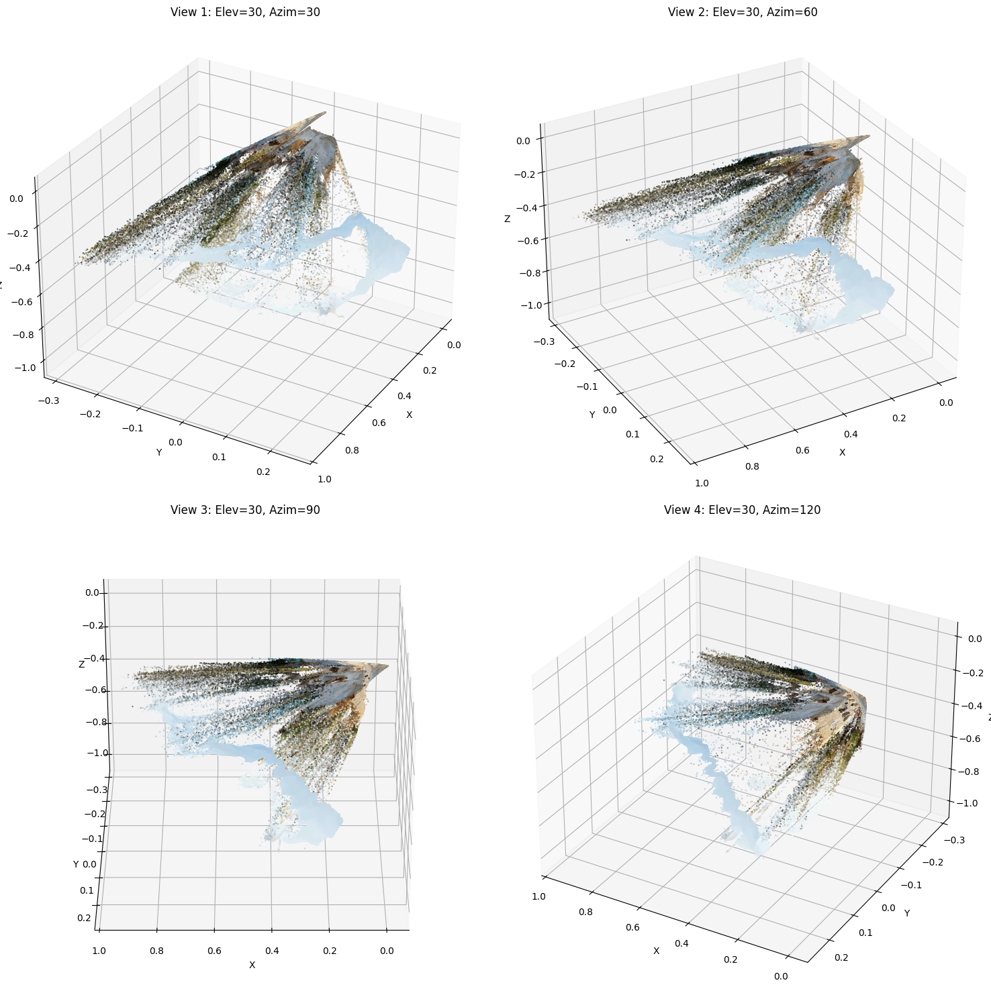

In [36]:
import matplotlib.pyplot as plt
import torch

# Assuming `image` is your input image
# Convert image to RGB format, ensuring values are between [0, 1]
rgb = torch.from_numpy(np.asarray(image).copy()).reshape(-1, 3).float().to(device) / 255.0

# Assuming get_pointcloud function is already defined
def plot_point_cloud(point_cloud, views=[(30, 30), (30, 60), (30, 90), (30, 120)], point_size=1):
    # Extract points and features from the point cloud
    points = point_cloud.points_packed()  # Get the points as a [N, 3] tensor
    features = point_cloud.features_packed()  # Get the features (colors) as a [N, 3] tensor

    # Convert to numpy for plotting
    points_np = points.cpu().numpy()
    features_np = features.cpu().numpy()  # Should already be normalized to [0, 1]

    # Create a figure with subplots
    fig = plt.figure(figsize=(15, 15))

    num_views = len(views)
    cols = 2  # Number of columns in the grid
    rows = (num_views + 1) // cols  # Number of rows in the grid

    for i, view in enumerate(views):
        ax = fig.add_subplot(rows, cols, i + 1, projection='3d')
        
        # Scatter plot with RGB colors
        ax.scatter(points_np[:, 0], points_np[:, 1], points_np[:, 2], c=features_np, s=point_size, marker='o')

        # Set labels
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')

        # Set view angle
        ax.view_init(elev=view[0], azim=view[1])

        ax.set_title(f'View {i+1}: Elev={view[0]}, Azim={view[1]}')

    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()

# Example usage:

plot_point_cloud(point_cloud, point_size=0.5)


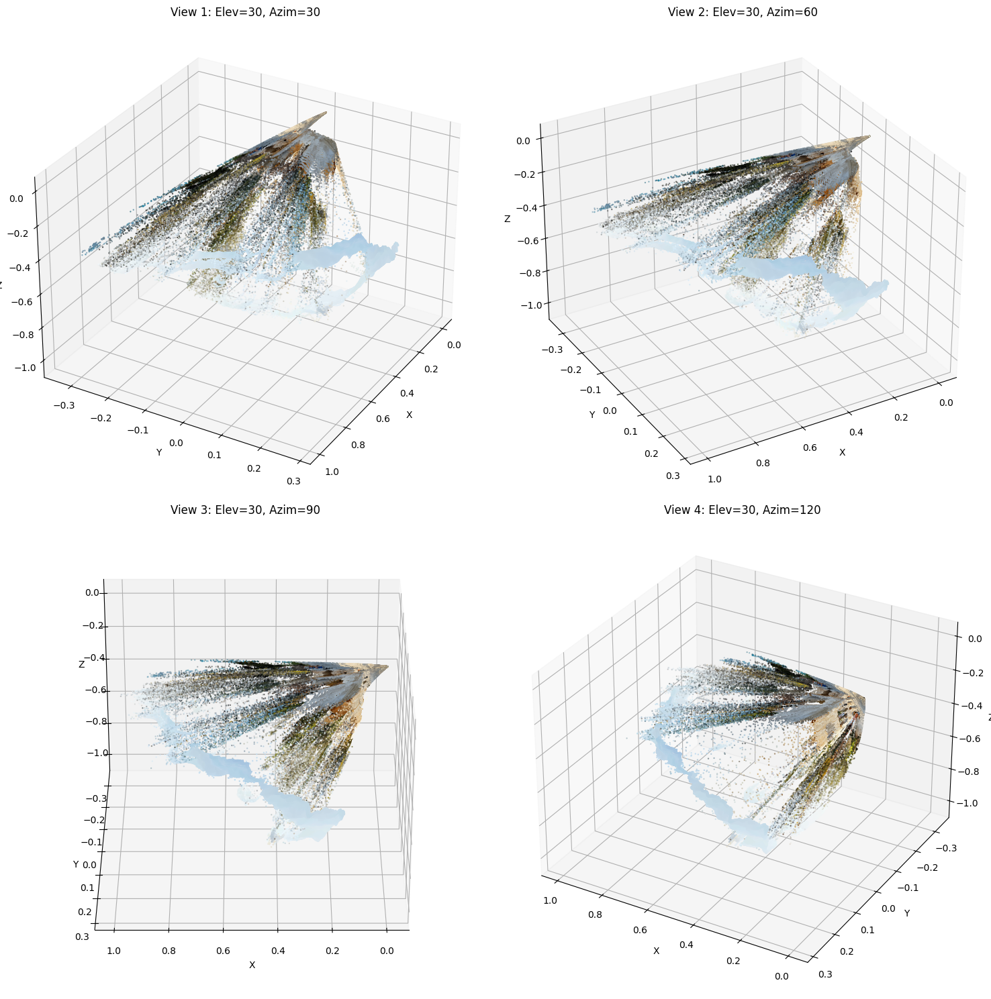

In [87]:
import matplotlib.pyplot as plt
import torch

# Assuming `image` is your input image
# Convert image to RGB format, ensuring values are between [0, 1]
rgb = torch.from_numpy(np.asarray(image).copy()).reshape(-1, 3).float().to(device) / 255.0

# Assuming get_pointcloud function is already defined
def plot_point_cloud(point_cloud, views=[(30, 30), (30, 60), (30, 90), (30, 120)], point_size=1):
    # Extract points and features from the point cloud
    points = point_cloud.points_packed()  # Get the points as a [N, 3] tensor
    features = point_cloud.features_packed()  # Get the features (colors) as a [N, 3] tensor

    # Convert to numpy for plotting
    points_np = points.cpu().numpy()
    features_np = features.cpu().numpy()  # Should already be normalized to [0, 1]

    # Create a figure with subplots
    fig = plt.figure(figsize=(15, 15))

    num_views = len(views)
    cols = 2  # Number of columns in the grid
    rows = (num_views + 1) // cols  # Number of rows in the grid

    for i, view in enumerate(views):
        ax = fig.add_subplot(rows, cols, i + 1, projection='3d')
        
        # Scatter plot with RGB colors
        ax.scatter(points_np[:, 0], points_np[:, 1], points_np[:, 2], c=features_np, s=point_size, marker='o')

        # Set labels
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')

        # Set view angle
        ax.view_init(elev=view[0], azim=view[1])

        ax.set_title(f'View {i+1}: Elev={view[0]}, Azim={view[1]}')

    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()

# Example usage:

plot_point_cloud(point_cloud, point_size=0.5)

In [89]:
ls

back_and_forth_camera_plot.png  gsplat.ipynb
camera_plot.png                 imageprocess.ipynb
camera_plots/                   rgb_0014.png
camera_plots_grid.png           robot_camera_trajectory.png
camera_trajectory.png           sphere_rot_xz_camera_trajectory.png
cameras_101.ipynb               spherical_camera_trajectory.png
depth_101.ipynb


In [96]:
cd .

/home/descobar/projects/xbase/src


In [108]:
cd external

/home/descobar/projects/xbase/external


In [109]:
import sys
import os
# Step 1: Add the external repository to the Python path
# Define the path manually
repo_path = '/home/descobar/projects/xbase/external/invisible_stitch'  # Replace with the actual path
sys.path.append(repo_path)

from external.invisible_stitch.utils.models import infer_with_zoe_dc,get_sd_pipeline, get_zoe_dc_model

In [112]:
from huggingface_hub import hf_hub_download
zoe_dc = get_zoe_dc_model(ckpt_path=hf_hub_download(repo_id="paulengstler/invisible-stitch", filename="invisible-stitch.pt")).to(device)

{'save_dir': '/home/descobar/shortcuts/monodepth3_checkpoints/pytorch3d_masked_depth_nyu_masked_zoedepth', 'project': 'ZoeDepth', 'tags': '', 'notes': '', 'gpu': None, 'root': '.', 'uid': None, 'print_losses': False, 'dataset': 'nyu', 'distributed': True, 'workers': 16, 'clip_grad': 0.1, 'use_shared_dict': False, 'shared_dict': None, 'use_amp': False, 'aug': True, 'random_crop': False, 'random_translate': False, 'translate_prob': 0.2, 'max_translation': 100, 'validate_every': 0.25, 'log_images_every': 0.1, 'prefetch': False, 'add_depth_channel': True, 'depth_channel_mask_augment': True, 'depth_masking_min': 0.3, 'depth_masking_max': 0.8, 'inpaint_task_probability': 0.5, 'debug_mode': True, 'batch_size': 1, 'random_inpainting_scaling': True, 'name': 'ZoeDepth', 'version_name': 'v1', 'n_bins': 64, 'bin_embedding_dim': 128, 'bin_centers_type': 'softplus', 'n_attractors': [16, 8, 4, 1], 'attractor_alpha': 1000, 'attractor_gamma': 2, 'attractor_kind': 'mean', 'attractor_type': 'inv', 'midas

Using cache found in /home/descobar/.cache/torch/hub/intel-isl_MiDaS_master


Params passed to Resize transform:
	width:  512
	height:  384
	resize_target:  True
	keep_aspect_ratio:  False
	ensure_multiple_of:  32
	resize_method:  minimal
Loaded successfully
Loaded weights from /home/descobar/.cache/huggingface/hub/models--paulengstler--invisible-stitch/snapshots/b2ca4086eeb25bd972e51d113978184308e287ac/invisible-stitch.pt


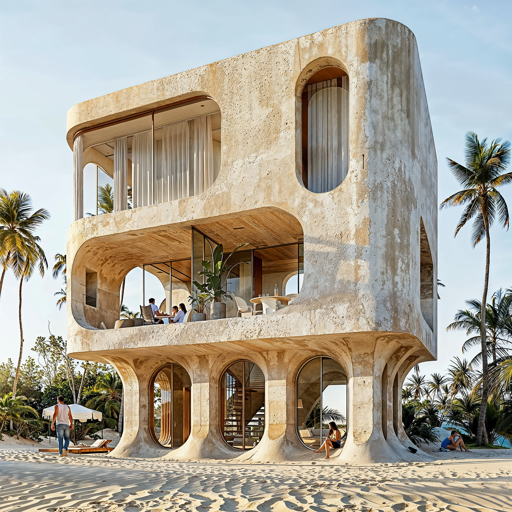

In [111]:
image

In [132]:
print("Infer_with_zoe_dc ....")
depth_scaling =0.9
t_initial_image = torch.from_numpy(np.asarray(image)/255.).permute(2,0,1).float().to(zoe_dc.device)
out_depth = aligned_depth = infer_with_zoe_dc(zoe_dc, t_initial_image, torch.zeros(h, w).to(zoe_dc.device),scaling=depth_scaling).cpu().numpy()
#out_depth = infer_with_zoe_dc(zoe_dc, torch.from_numpy(np.asarray(image)/255.).permute(2,0,1).float().to(zoe_dc.device), (torch.from_numpy(depth)).to(zoe_dc.device), scaling=depth_scaling).cpu().numpy()
# Use the function to convert out_depth to a PIL image
depth_pil_image = convert_depth_to_image(out_depth)

Infer_with_zoe_dc ....


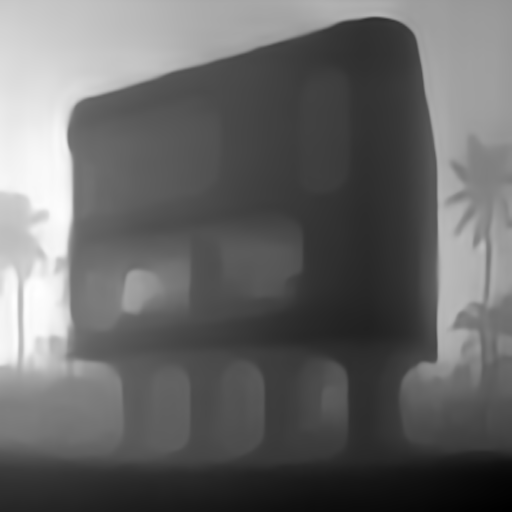

In [134]:
depth_pil_image

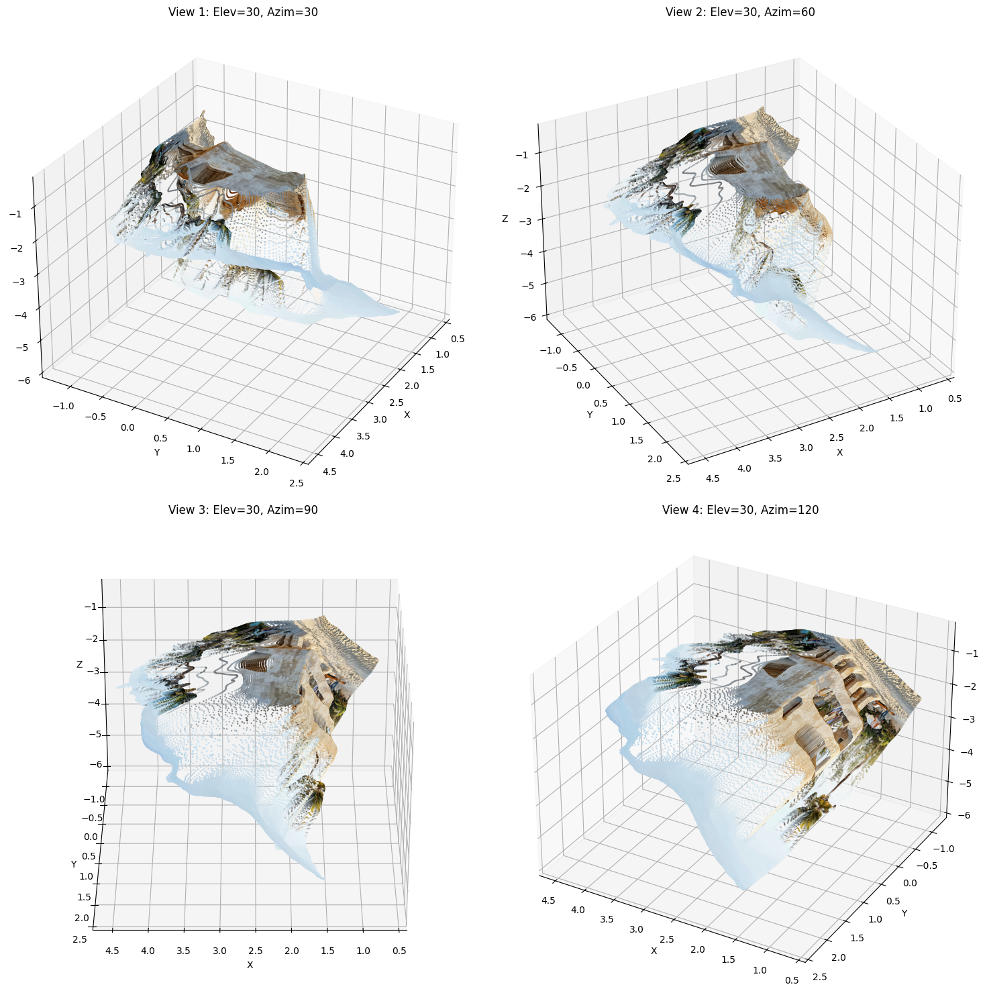

In [136]:

xy_depth_world = project_points(cameras, out_depth.squeeze(), use_pixel_centers=True)

rgb = (torch.from_numpy(np.asarray(image).copy()).reshape(-1, 3).float() / 255).to(device)
point_cloud = None
if point_cloud is None:
    point_cloud = get_pointcloud(xy_depth_world[0], device=device, features=rgb)
    
plot_point_cloud(point_cloud, point_size=0.5)

In [137]:
cams

[PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras(),
 PerspectiveCameras()]